### **Group Members**
Chan, Frankie #19622224 \
Davey, Micah #83248963 \
Li, Jack #12228466 \
Nguyen, Anne #46591046 \
Teng, Samantha #70335658

In [1]:
install.packages("GGally")
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(GGally)
library(AER)
library(gridExtra)
library(latex2exp)
library(tidymodels)
library(faraway)
library(mltools)
library(leaps)
library(glmnet)
library(modelr)

also installing the dependency ‘ggstats’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



ERROR: Error in library(AER): there is no package called ‘AER’


## Introduction

## Preliminary analysis

,TARGET_deathRate,medIncome,povertyPercent,PctPrivateCoverage,PctPublicCoverage
,<dbl>,<int>,<dbl>,<dbl>,<dbl>
1,164.9,61898,11.2,75.1,32.9
2,161.3,48127,18.6,70.2,31.1
3,174.7,49348,14.6,63.7,42.1
4,194.8,44243,17.1,58.4,45.3
5,144.4,49955,12.5,61.6,44.0
6,176.0,52313,15.6,60.0,43.2


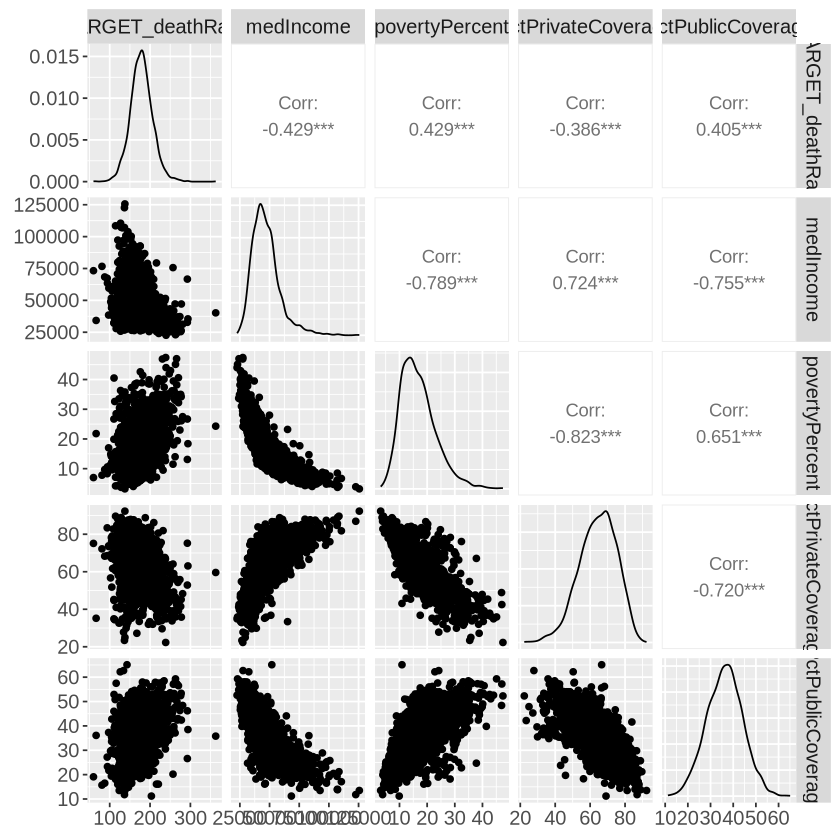

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
`geom_smooth()` using formula = 'y ~ x'


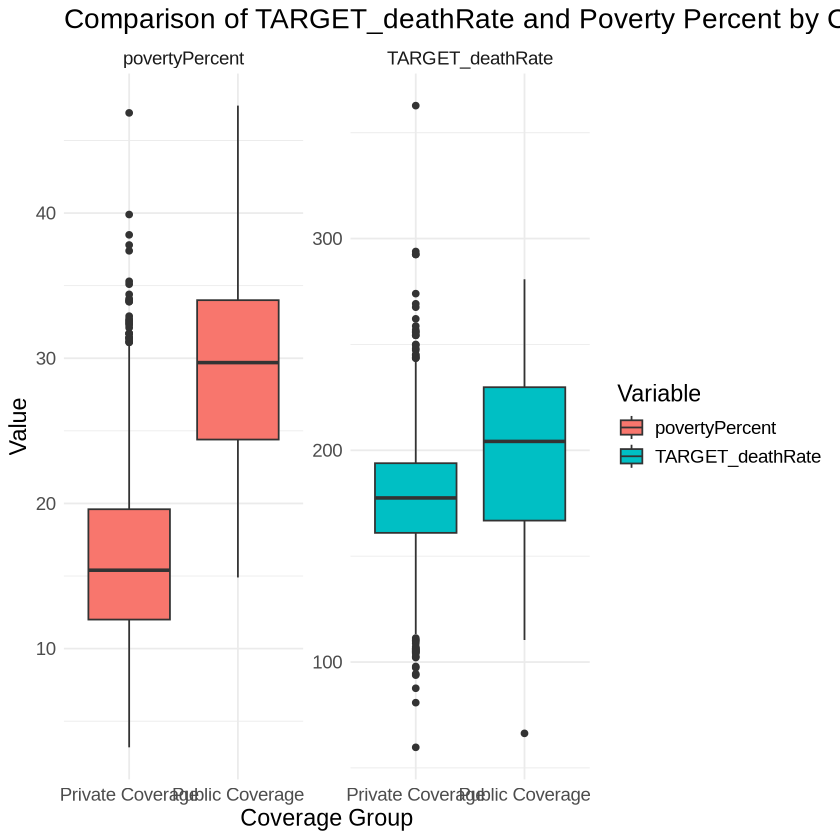

term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),150.27,10.25,14.66,0.00,130.18,170.37
medIncome,0.00,0.00,-4.44,0.00,0.00,0.00
povertyPercent,1.01,0.14,7.17,0.00,0.74,1.29
PctPrivateCoverage,0.07,0.08,0.83,0.41,-0.09,0.23
PctPublicCoverage,0.60,0.09,6.32,0.00,0.41,0.78


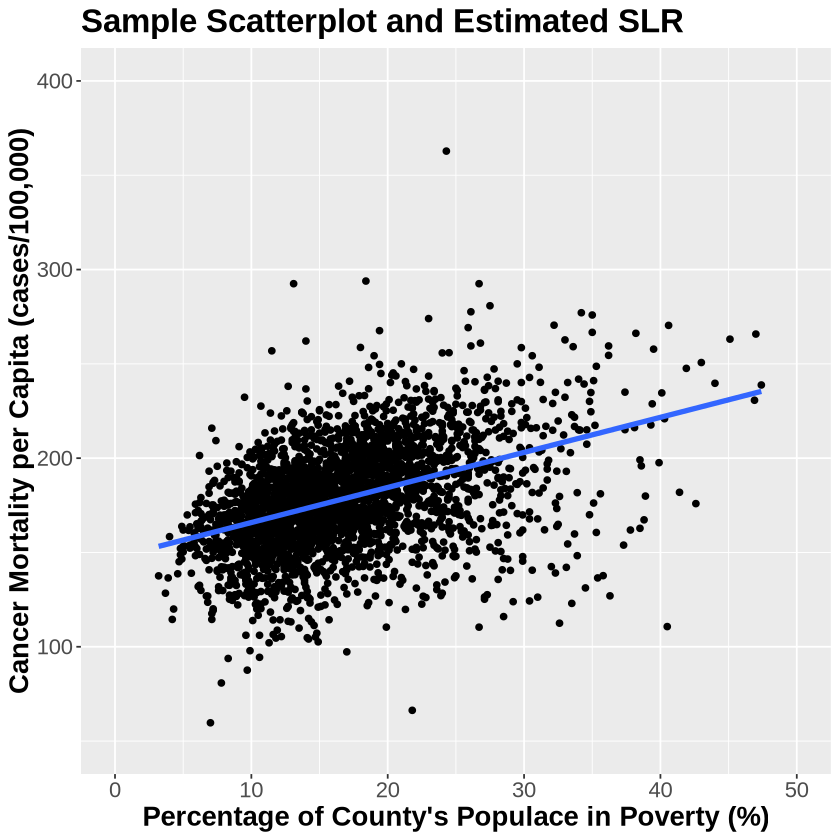

In [2]:
#Loading and cleaning the data
cancer_data <- read.csv("US_county_cancer_data.csv") |>
    select(TARGET_deathRate, medIncome, povertyPercent, PctPrivateCoverage, PctPublicCoverage) |>
    na.omit()
head(cancer_data) 

cancer_pair_plots <- 
   cancer_data |>
   ggpairs(progress = FALSE) +
   theme(text = element_text(size = 15))
cancer_pair_plots

# Create a new variable for group comparison based on PctPrivateCoverage and PctPublicCoverage
cancer_data_long <- cancer_data |>
  pivot_longer(cols = c(TARGET_deathRate, povertyPercent), 
               names_to = "Variable", values_to = "Value") |>
  mutate(Group = case_when(
    PctPrivateCoverage > PctPublicCoverage ~ "Private Coverage",
    TRUE ~ "Public Coverage"
  ))

# Create the boxplot
ggplot(cancer_data_long, aes(x = Group, y = Value, fill = Variable)) +
  geom_boxplot() +
  facet_wrap(~ Variable, scales = "free_y") +
  labs(title = "Comparison of TARGET_deathRate and Poverty Percent by Coverage Group",
       x = "Coverage Group", y = "Value") +
  theme_minimal() +
  theme(text = element_text(size = 14))

SLR_cancer_plot_povertyPercent <- 
    cancer_data %>%
    ggplot(aes(x = povertyPercent, y = TARGET_deathRate)) +
    geom_point() +
    geom_smooth(method = lm, se = FALSE, size = 1.5) +
    coord_cartesian(xlim = c(0, 50), ylim = c(50, 400)) +
    xlab("Percentage of County's Populace in Poverty (%)") +
    ylab("Cancer Mortality per Capita (cases/100,000)") +
    ggtitle("Sample Scatterplot and Estimated SLR") +
    theme(
        text = element_text(size = 16.5),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold"))
SLR_cancer_plot_povertyPercent

cancer_data_LR <- lm(TARGET_deathRate ~ ., data = cancer_data)
cancer_data_LR_results <- 
    tidy(cancer_data_LR, conf.int = TRUE) %>% 
    mutate_if(is.numeric, round, 2)
cancer_data_LR_results